# California house prices

This is the dataset used in the second chapter of Aurélien Géron's recent book 'Hands-On Machine learning with Scikit-Learn and TensorFlow'. It serves as an excellent introduction to implementing machine learning algorithms because it requires rudimentary data cleaning, has an easily understandable list of variables and sits at an optimal size between being to toyish and too cumbersome.

The data contains information from the 1990 California census.

This notebook uses Pipelines for data processing and regressor training. This is specially useful for avoiding data leaks when doing crossvalidation and model selection via GridSearch.

In [1]:
# Some notebook settings
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

## Initial data exploration

In [2]:
import pandas as pd
HOUSES_CSV_PATH = ('/home/diego/Documents/Books/Hands_on_Machine_Learning_with_Scikit_Learn/'
                   'handson-ml/datasets/housing/housing.csv')
housing = pd.read_csv(HOUSES_CSV_PATH)
print('Shape: ', housing.shape)
target = 'median_house_value'
print('Target: ', target)


housing.head(10)

Shape:  (20640, 10)
Target:  median_house_value


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


Are there any missing values?

In [3]:
housing.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

Histogram of the target variable:

Skewness:  0.9776922140978416
Kurtosis:  0.3275001388119616


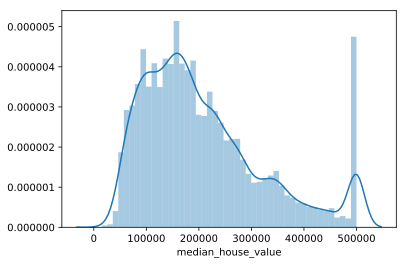

In [4]:
import seaborn as sns
from scipy.stats import skew, kurtosis

print('Skewness: ', skew(housing[target]))
print('Kurtosis: ', kurtosis(housing[target]))
sns.distplot(housing[target])

It seems there is a problem with data: there are a lot of observations censored at 500.000.

Creating a pair_plot of the most correlated variables with respect to the target to further inspect the problem:

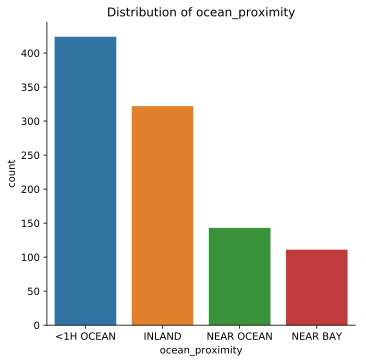

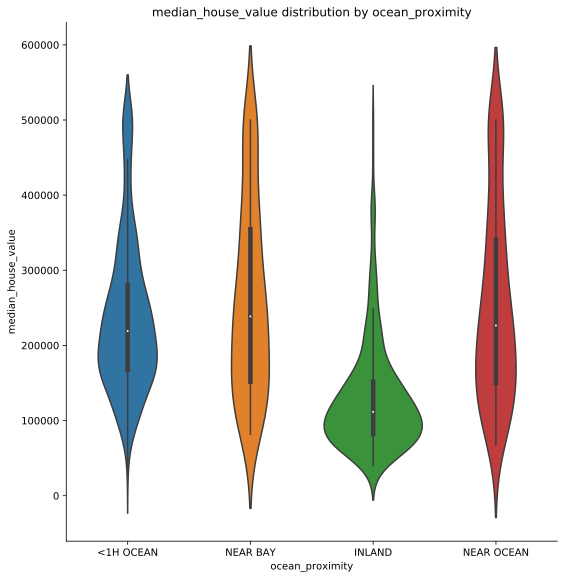

In [5]:
from PairPlot import pair_plot, joint_plot  # custom-made pairs plot library

pair_plot(housing, sample=1000, target='median_house_value', num_cols=8)

Finding how many observations present the censoring problem:

In [6]:
housing[target].value_counts().head(5)

500001.0    965
137500.0    122
162500.0    117
112500.0    103
187500.0     93
Name: median_house_value, dtype: int64

In [7]:
965/len(housing) * 100

4.675387596899225

~4.68% of data is censored. By now, the corresponding records will be discarded in the totality of the data set.

Shape:  (19675, 10)
Skewness:  0.8095099388023556
Kurtosis:  0.162607995059743


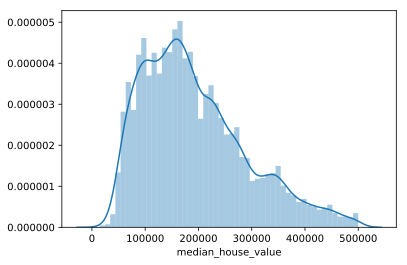

In [8]:
housing = housing.loc[housing[target] <= 500_000].copy()

print('Shape: ', housing.shape)
print('Skewness: ', skew(housing[target]))
print('Kurtosis: ', kurtosis(housing[target]))
sns.distplot(housing[target])
plt.savefig('images/Dist1.svg')

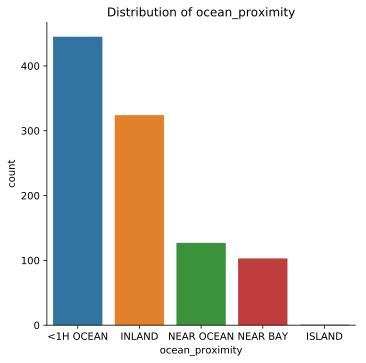

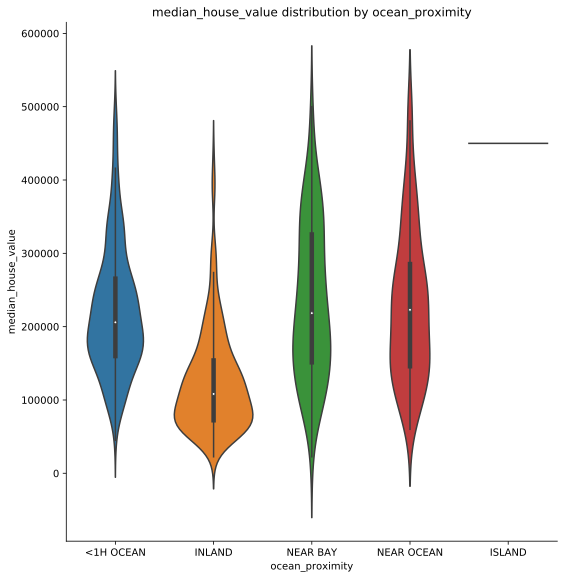

In [9]:
pair_plot(housing, sample=1000, target='median_house_value', num_cols=8)

## Stratified train-test split

To reduce sampling bias, it is desirable to make a stratified sample of train-test.

As median income is the most important feature in the dataset, it will be used for the stratified split

In [10]:
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit


def stratified_split(df, col, test_size):
    split = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)
    for train_index, test_index in split.split(df, df[col]):
        strat_train = df.iloc[train_index]
        strat_test = df.iloc[test_index]
    return strat_train, strat_test


def split_and_compare(housing_in, col, test_size):
    housing = housing_in.copy()
    housing['col_strat'] = pd.cut(housing[col], bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
                                   labels=[1, 2, 3, 4, 5])

    def income_cat_proportions(df, col):
        return df[col].value_counts() / len(df)

    # Compare the two train-test splits:
    train, test = train_test_split(housing, test_size=test_size, random_state=42)
    strat_train, strat_test = stratified_split(housing, 'col_strat', test_size)
    compare_props = pd.DataFrame({"income_cat": housing['col_strat'].value_counts().index,
                                  "Overall": income_cat_proportions(housing, 'col_strat'),
                                  "Random": income_cat_proportions(test, 'col_strat'),
                                 "Stratified": income_cat_proportions(strat_test, 'col_strat')}
                                 ).sort_index()
    compare_props["Rand. %error"] = 100 * compare_props["Random"] / compare_props["Overall"] - 100
    compare_props["Strat. %error"] = 100 * compare_props["Stratified"] / compare_props["Overall"] - 100
    print('Bias error comparison, normal split vs. stratified split:\n', compare_props)
    del housing['col_strat'], strat_train['col_strat'], strat_test['col_strat']
    del train['col_strat'], test['col_strat']
    return strat_train, strat_test



train_raw, test_raw = split_and_compare(housing, col="median_income", test_size=0.2)
print('\nTrain shape: ', train_raw.shape, '\nTest shape: ', test_raw.shape)

Bias error comparison, normal split vs. stratified split:
   income_cat   Overall    Random  Stratified  Rand. %error  Strat. %error
1          1  0.041372  0.041931    0.041423      1.351351       0.122850
2          2  0.333011  0.328590    0.332910     -1.327839      -0.030525
3          3  0.361017  0.353494    0.361118     -2.083627       0.028157
4          4  0.177992  0.183227    0.177891      2.941176      -0.057110
5          5  0.086607  0.092757    0.086658      7.100939       0.058685

Train shape:  (15740, 10) 
Test shape:  (3935, 10)


In [11]:
X_train_raw = train_raw.drop(target, axis=1)
X_test_raw = test_raw.drop(target, axis=1)

y_train_raw = train_raw[[target]]
y_test_raw = test_raw[[target]]

## Transforming the target variable: y pipeline definition

Skewness:  [-0.02249037]
Kurtosis:  [-0.57151653]


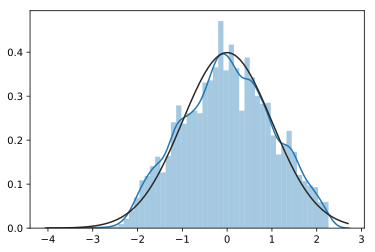

In [12]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer
from scipy.stats import norm

# Using DataFrameMapper instead of Pipes because it can return a DataFrame
y_pipe = Pipeline(steps=[
    ('transform', PowerTransformer(method='box-cox', standardize=True))
])

y_train = y_pipe.fit_transform(y_train_raw)
y_test = y_pipe.transform(y_test_raw)   
# when transorming the test target only transform is used (transformer is fitted on train data)

sns.distplot(y_train, fit=norm)
print('Skewness: ', skew(y_train))
print('Kurtosis: ', kurtosis(y_train))

## Feature engineering

In [13]:
# Select columns by numeric or categorical type
num_cols = X_train_raw.select_dtypes(['number']).columns
cat_cols = X_train_raw.select_dtypes(exclude=['number']).columns
print(f'Numeric features: {", ".join(num_cols)}')
print(f'\nCategorical features: {", ".join(cat_cols)}')

Numeric features: longitude, latitude, housing_median_age, total_rooms, total_bedrooms, population, households, median_income

Categorical features: ocean_proximity


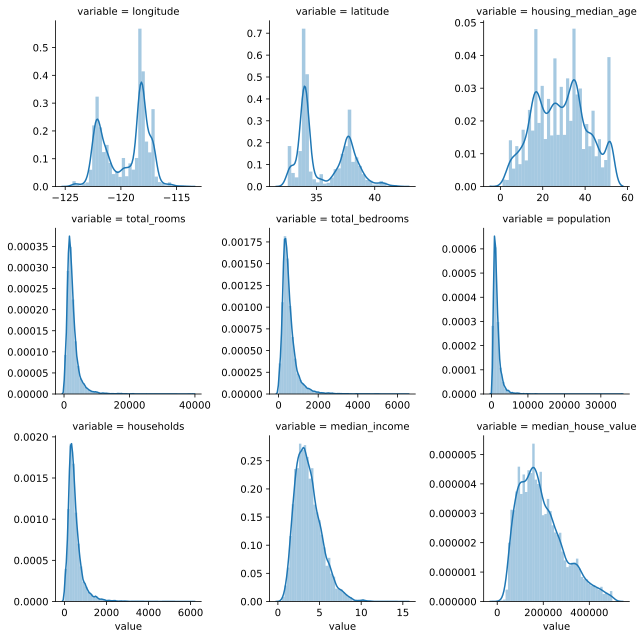

In [14]:
from PairPlot import hist_plots

hist_plots(train_raw)

The features latitude and longitude present a bimodal distribution, and can be transformed using the QuantileTransformer from Sklearn:

In [15]:
from sklearn.preprocessing import QuantileTransformer  # might use RobustScaler as well

trans = QuantileTransformer(output_distribution='normal')
long = X_train_raw['longitude'].values
long

array([-122.26, -122.32, -118.26, ..., -118.5 , -117.91, -121.63])

In [16]:
long = trans.fit_transform(long.reshape(-1, 1))
long

array([[-1.22328725],
       [-1.34949764],
       [ 0.29660674],
       ...,
       [ 0.00627288],
       [ 0.79532164],
       [-0.63638652]])

Skewness:  -0.0026342142974853
Kurtosis:  0.022214862523137757


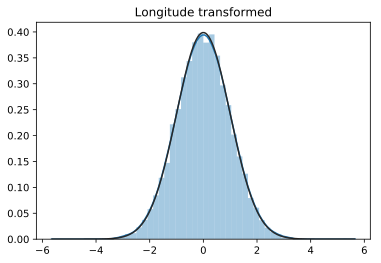

In [17]:
sns.distplot(long.flat, fit=norm)
plt.title('Longitude transformed')
print('Skewness: ', skew(long.flat))
print('Kurtosis: ', kurtosis(long.flat))

Wrapping the transformer in a pipeline using DataFrameMapper: (columns: latitude and longitude)

In [18]:
from sklearn_pandas import DataFrameMapper

quantile_mapper = DataFrameMapper([
    (['latitude'], QuantileTransformer(output_distribution='normal')),
    (['longitude'], QuantileTransformer(output_distribution='normal'))
], df_out=True, default=None)  # Default=None: passthrough of the other columns

In [19]:
# test of the quantile transformer:
quantile_mapper.fit_transform(X_train_raw)

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
38,0.839121,-1.223287,52,1470,330,689,309,3.48,NEAR BAY
18744,2.225823,-1.349498,15,2524,449,1374,467,3.3816,INLAND
4905,-0.493553,0.296607,47,1269,323,1628,325,1.5089,<1H OCEAN
11193,-0.899534,0.781626,38,1316,263,671,278,3.2969,<1H OCEAN
19601,0.543789,-0.384375,27,925,176,449,168,2.6406,INLAND
20256,-0.061513,-0.104318,33,1039,256,1432,272,3.1103,NEAR OCEAN
16650,0.116719,-0.326900,23,1630,253,704,263,5.156,NEAR OCEAN
1373,1.018778,-1.033647,20,6992,1404,3221,1334,4.2042,NEAR BAY
9635,0.342823,-0.400635,17,1118,270,560,244,2.0216,INLAND
13294,-0.304482,1.020888,37,2576,468,1284,428,3.3958,INLAND


### Creating new features

Define a Transformer class used to create new features:

In [20]:
from sklearn.base import BaseEstimator, TransformerMixin  # Used to create custom transformers


class ExtendFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def transform(self, X, y=None):
        X = X.copy()
        # Create new features
        X['rooms_per_house'] = X['total_rooms'] / X['households']
        X['population_per_house'] = X['population'] / X['households']
        X['bedrooms_per_house'] = X['total_bedrooms'] / X['total_rooms']
        # Save column names
        self.columns = list(X.columns)
        return X
    
    def fit(self, X, y=None):
        return self          # do nothing
    
    def get_feature_names(self):
        return self.columns

## Preprocessing pipeline definition:

In [21]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer

# Define numerical pipeline
num_preprocess = Pipeline(steps=[
    ('extend_features', ExtendFeatures()),
    ('quantile_mapper', quantile_mapper),
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', PowerTransformer())
])

# Define categorical pipeline
cat_preprocess = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),   # it also works for categoricals
    ('encoder', OneHotEncoder())
])

preprocessing_pipe = ColumnTransformer(transformers=[
    ('numeric', num_preprocess, num_cols),
    ('categorical', cat_preprocess, cat_cols)
])

In [22]:
X_preprocessed_np = preprocessing_pipe.fit_transform(X_train_raw)
X_preprocessed_np.shape

(15740, 16)

In [23]:
from CustomFunctions import get_column_names_from_ColumnTransformer            

cols = get_column_names_from_ColumnTransformer(preprocessing_pipe, verbose=False)
print(f'Found {len(cols)} features:\n', cols)

Found 16 features:
 ['latitude', 'longitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'rooms_per_house', 'population_per_house', 'bedrooms_per_house', 'x0_1HOCEAN', 'x0_INLAND', 'x0_ISLAND', 'x0_NEARBAY', 'x0_NEAROCEAN']


In [24]:
preprocessed = pd.DataFrame(X_preprocessed_np, columns=cols)
preprocessed[target] = y_train
preprocessed

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_house,population_per_house,bedrooms_per_house,x0_1HOCEAN,x0_INLAND,x0_ISLAND,x0_NEARBAY,x0_NEAROCEAN,median_house_value
0,0.838825,-1.222827,1.782406,-0.523576,-0.437691,-0.753722,-0.437965,0.025772,-0.258692,-0.975415,0.396081,0.0,0.0,0.0,1.0,0.0,0.182958
1,2.224560,-1.348907,-1.066788,0.218680,-0.005212,0.193320,0.148842,-0.041468,0.233388,0.179627,-0.677733,0.0,1.0,0.0,0.0,0.0,-1.099597
2,-0.493351,0.296384,1.429462,-0.710869,-0.466750,0.449894,-0.369255,-1.709146,-1.056291,2.027010,0.914324,1.0,0.0,0.0,0.0,0.0,-0.741553
3,-0.899291,0.781631,0.775113,-0.665098,-0.738572,-0.787143,-0.579233,-0.100515,-0.278143,-0.633104,-0.124432,1.0,0.0,0.0,0.0,0.0,0.457926
4,0.543652,-0.384538,-0.067162,-1.093963,-1.236269,-1.270169,-1.205841,-0.599935,0.303364,-0.206905,-0.354404,0.0,1.0,0.0,0.0,0.0,-0.541891
5,-0.061405,-0.104566,0.398968,-0.956196,-0.773369,0.254944,-0.607952,-0.234635,-1.147427,2.173700,0.784977,0.0,0.0,0.0,0.0,1.0,-0.359521
6,0.116768,-0.327086,-0.388762,-0.388352,-0.788511,-0.726382,-0.651953,0.994859,0.739793,-0.200487,-1.356984,0.0,0.0,0.0,0.0,1.0,0.728612
7,1.018376,-1.033367,-0.636875,1.877436,1.868868,1.588746,1.923003,0.481078,0.116783,-0.631562,-0.102455,0.0,0.0,0.0,1.0,0.0,-0.084990
8,0.342780,-0.400791,-0.892053,-0.867525,-0.704494,-1.010087,-0.748762,-1.157336,-0.407059,-0.849657,0.703531,0.0,1.0,0.0,0.0,0.0,-0.791678
9,-0.304314,1.021069,0.700679,0.248417,0.055211,0.093601,0.020144,-0.031676,0.633303,0.256022,-0.575580,0.0,1.0,0.0,0.0,0.0,-0.532285


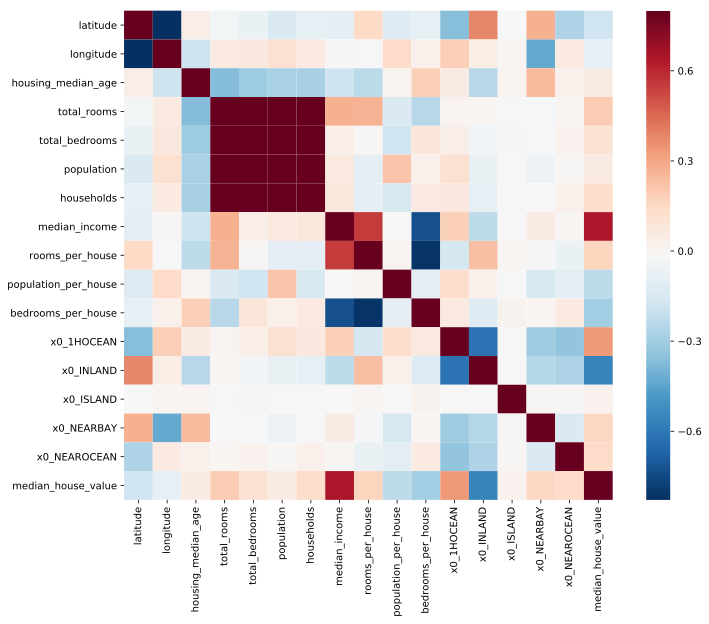

In [25]:
#correlation matrix
corr_matrix = preprocessed.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corr_matrix, vmax=.8, square=True, cmap="RdBu_r");

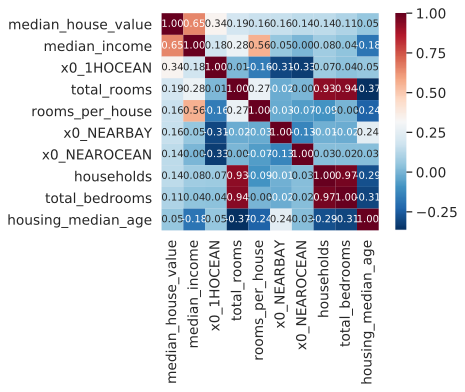

In [26]:
cols = corr_matrix.nlargest(10, target)[target].index
cm = np.corrcoef(preprocessed[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values, cmap="RdBu_r")
plt.show()

Candidates to drop: total_bedrooms, population (to be confirmed with Feature importance of a Randon Forest regressor)

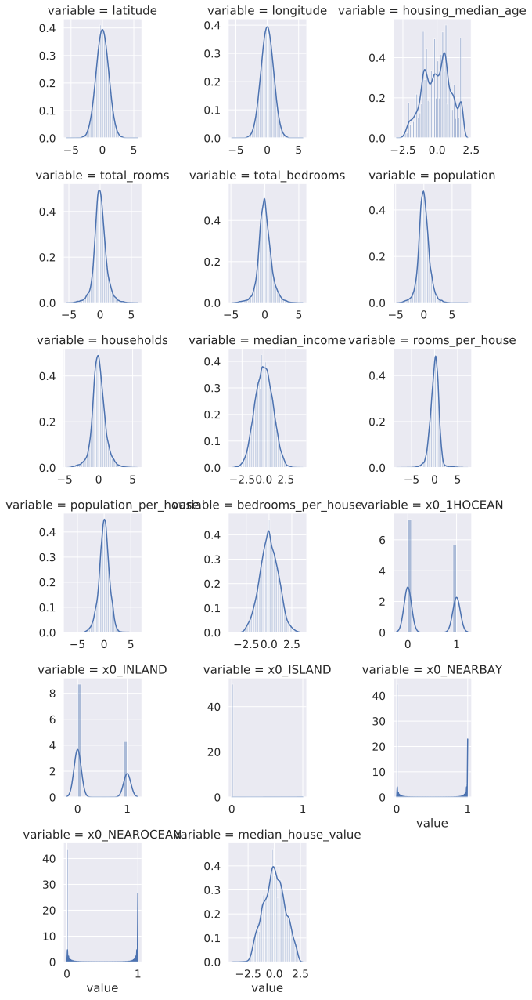

In [27]:
from PairPlot import hist_plots

hist_plots(preprocessed)

In [28]:
X_preprocessed_np

array([[ 0.83882527, -1.22282726,  1.782406  , ...,  0.        ,
         1.        ,  0.        ],
       [ 2.22455957, -1.34890658, -1.06678776, ...,  0.        ,
         0.        ,  0.        ],
       [-0.49335134,  0.29638362,  1.42946168, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.0400562 ,  0.00601392, -0.1466667 , ...,  0.        ,
         0.        ,  0.        ],
       [-0.89929069,  0.79533613, -0.22674992, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.24325444, -0.63641365,  0.47501809, ...,  0.        ,
         0.        ,  0.        ]])

# Define regression pipelines

## Train a linear regression pipe

In [29]:
from sklearn.linear_model import LinearRegression

lm_pipe = Pipeline(steps=[
    ('preprocess', preprocessing_pipe),
    ('reg', LinearRegression())
])

lm_pipe.fit(X_train_raw, y_train)

Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ..., ('reg', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False))])

### Define function to predict and score regression models

In [30]:
from sklearn.metrics import mean_squared_error, explained_variance_score

def predict_and_score(model):
    # predict, uses inverse transform of y pipe
    test_predictions = model.predict(X_test_raw)
    test_predictions = y_pipe.inverse_transform(test_predictions.reshape(-1, 1))  
    # scores
    rmse_test = np.sqrt(mean_squared_error(test_predictions, y_test_raw))
    mape_test = np.mean(np.abs(y_test_raw.values - test_predictions) / y_test_raw.values) * 100
    print(f'Test RMSE: {rmse_test:.0f}')
    print(f'Test MAPE:  {mape_test:.2f}%')
    print(f'Explained variance: {explained_variance_score(y_test_raw, test_predictions) * 100:.2f}%')

In [31]:
predict_and_score(lm_pipe)

Test RMSE: 58210
Test MAPE:  24.55%
Explained variance: 63.90%


## Train a Ridge and Lasso regression using Polynomial a feature adder

### Define a polynomial feature adder and modify the preprocessing pipe

In [32]:
from sklearn_pandas import DataFrameMapper, gen_features
from sklearn.preprocessing import PolynomialFeatures

cols_to_poly = ['median_income', 'rooms_per_house', 'housing_median_age', 'population_per_house']

transformers = [{'class': PolynomialFeatures, 'degree': 4, 'include_bias': False}]
col_trans = gen_features([[col] for col in cols_to_poly], transformers)

poly_adder = DataFrameMapper(col_trans, df_out=True, default=None)

In [33]:
# Define numerical_poly pipeline
num_poly_preprocess = Pipeline(steps=[
    ('extend_features', ExtendFeatures()),
    ('poly_adder', poly_adder),
    ('quantile_mapper', quantile_mapper),
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', PowerTransformer())
])

poly_preprocessing_pipe = ColumnTransformer(transformers=[
    ('poly_numeric', num_poly_preprocess, num_cols),
    ('categorical', cat_preprocess, cat_cols)
])

### Create a Ridge pipe

In [34]:
from sklearn.linear_model import Ridge

ridge_pipe = Pipeline(steps=[
    ('poly_preprocess', poly_preprocessing_pipe),
    ('reg', Ridge(alpha=0.1, solver='cholesky'))
])

ridge_pipe.fit(X_train_raw, y_train)

Pipeline(memory=None,
     steps=[('poly_preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('poly_numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('poly_adder', DataFrameMapper(default=None, df_out=Tr...ntercept=True, max_iter=None,
   normalize=False, random_state=None, solver='cholesky', tol=0.001))])

In [35]:
predict_and_score(ridge_pipe)

Test RMSE: 57939
Test MAPE:  24.23%
Explained variance: 64.23%


### Create a Lasso pipe

In [36]:
from sklearn.linear_model import Lasso

lasso_pipe = Pipeline(steps=[
    ('poly_preprocess', poly_preprocessing_pipe),
    ('reg', Lasso(alpha=0.1, max_iter=100000))
])

lasso_pipe.fit(X_train_raw, y_train)

Pipeline(memory=None,
     steps=[('poly_preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('poly_numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('poly_adder', DataFrameMapper(default=None, df_out=Tr...e=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))])

In [37]:
predict_and_score(lasso_pipe)

Test RMSE: 65244
Test MAPE:  28.14%
Explained variance: 55.38%


### Create an ElasticNet pipe

In [38]:
from sklearn.linear_model import ElasticNet

elastic_net_pipe = Pipeline(steps=[
    ('poly_preprocess', poly_preprocessing_pipe),
    ('reg', ElasticNet(alpha=0.1, l1_ratio=0.5, max_iter=1_000_000))
])

elastic_net_pipe.fit(X_train_raw, y_train)

Pipeline(memory=None,
     steps=[('poly_preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('poly_numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('poly_adder', DataFrameMapper(default=None, df_out=Tr...alse, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False))])

In [39]:
predict_and_score(elastic_net_pipe)

Test RMSE: 62268
Test MAPE:  26.68%
Explained variance: 59.21%


## Random Forest regressor pipe

In [40]:
from sklearn.ensemble import RandomForestRegressor


rf_pipe = Pipeline(steps=[
    ('preprocess', preprocessing_pipe),
    ('reg', RandomForestRegressor(n_estimators=100))
])

In [41]:
rf_pipe.fit(X_train_raw, y_train.flat)

Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...tors=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False))])

In [42]:
predict_and_score(rf_pipe)

Test RMSE: 44066
Test MAPE:  16.65%
Explained variance: 79.19%


### Make a grid search to tune the hyperparameters of the RF pipe

In [43]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'reg__bootstrap': [False],
    'reg__max_depth': [None] + [x for x in range(1, 10, 1)],
    'reg__max_features': ['sqrt'],
    'reg__min_samples_leaf': [1, 2, 4],
    'reg__min_samples_split': [2, 5, 10],
    'reg__n_estimators': range(10, 1000, 50)
}

rf_grid_search = RandomizedSearchCV(rf_pipe, param_distributions=param_grid, cv=3, 
                                    scoring='neg_mean_squared_error', n_iter = 20, 
                                    verbose=1, random_state=42, n_jobs=-1)
rf_grid_search.fit(X_train_raw, y_train.ravel())

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.1min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...tors=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False))]),
          fit_params=None, iid='warn', n_iter=20, n_jobs=-1,
          param_distributions={'reg__bootstrap': [False], 'reg__max_depth': [None, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'reg__max_features': ['sqrt'], 'reg__min_samples_leaf': [1, 2, 4], 'reg__min_samples_split': [2, 5, 10], 'reg__n_estimators': range(10, 1000, 50)},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='neg_mean_squared_error',
          verbose=1)

In [44]:
predict_and_score(rf_grid_search)

Test RMSE: 43759
Test MAPE:  16.50%
Explained variance: 79.60%


Set parameters found into rf_pipe:

In [45]:
rf_grid_search.best_params_

{'reg__n_estimators': 510,
 'reg__min_samples_split': 2,
 'reg__min_samples_leaf': 2,
 'reg__max_features': 'sqrt',
 'reg__max_depth': None,
 'reg__bootstrap': False}

In [46]:
rf_pipe.set_params(**rf_grid_search.best_params_)

Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...tors=510, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False))])

Test that the parameters were correctly set in the pipe:

In [47]:
rf_pipe.fit(X_train_raw, y_train.ravel())
predict_and_score(rf_pipe)

Test RMSE: 43676
Test MAPE:  16.52%
Explained variance: 79.67%


Which is quite similar to the result found using gridsearch (small differences due to the CV procedure that gridsearch does).

## Principal components analysis

In [48]:
from sklearn.decomposition import PCA

n_components = 7
pca = PCA(n_components)
x_pca = pca.fit_transform(preprocessed.drop(target, axis=1))
print('Explained variance: \n', pca.explained_variance_ratio_)  # [0.84, 0.14]
cumsum = np.cumsum(pca.explained_variance_ratio_)   # plot cumsum
print('\nCumulative explained variance: \n', cumsum)
d = np.argmax(cumsum >= 0.95) + 1

Explained variance: 
 [0.34013303 0.21667788 0.16410612 0.09090704 0.07756537 0.0478922
 0.01993431]

Cumulative explained variance: 
 [0.34013303 0.55681091 0.72091703 0.81182407 0.88938944 0.93728164
 0.95721595]


Text(0.5, 1.0, 'Explained variance per # of principal components')

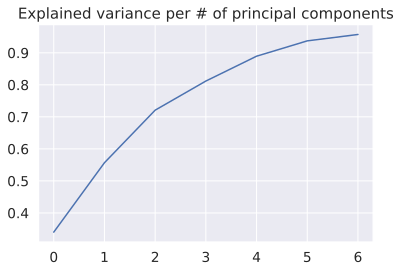

In [49]:
plt.plot(cumsum)
plt.title('Explained variance per # of principal components')

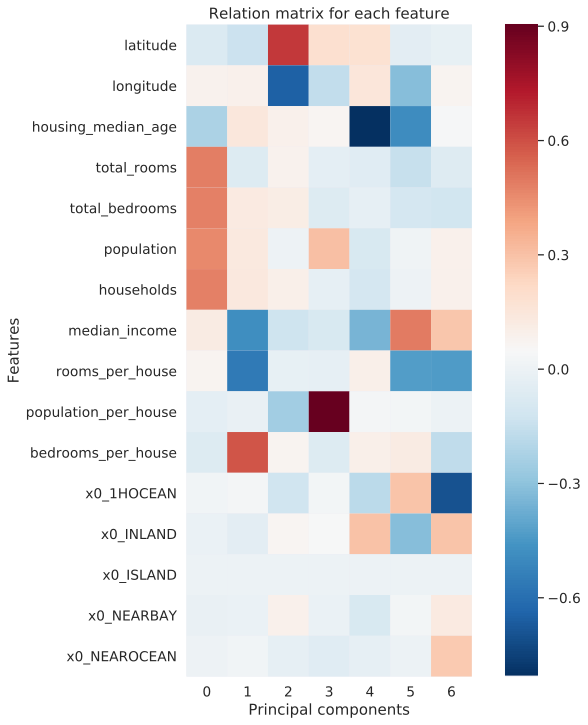

In [50]:
plt.figure(figsize=(12,12))
sns.heatmap(pca.components_.T,
            yticklabels=preprocessed.drop(target,axis=1).columns,
            xticklabels=[str(i) for i in range(n_components)],
            cmap="RdBu_r", square=True)
plt.ylabel('Features')
plt.xlabel('Principal components')
plt.title('Relation matrix for each feature')
plt.show()

## Using PCA inside the regression pipe, gridsearch

In [51]:
from sklearn.ensemble import RandomForestRegressor


rf_pca_pipe = Pipeline(steps=[
    ('preprocess', preprocessing_pipe),
    ('pca', PCA(n_components=7)),
    ('reg', RandomForestRegressor(n_jobs=-1))
])

In [52]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'reg__bootstrap': [False],
    'reg__max_depth': [None] + [x for x in range(1, 10, 2)],
    'reg__max_features': ['sqrt'],
    'reg__min_samples_leaf': [1, 2, 4],
    'reg__min_samples_split': [2, 5, 10],
    'reg__n_estimators': range(10, 1000, 100)
}

rf_pca_grid_search = RandomizedSearchCV(rf_pca_pipe, param_distributions=param_grid, cv=3, 
                                        scoring='neg_mean_squared_error', n_iter = 20, 
                                        verbose=1, random_state=42, n_jobs=-1)
rf_pca_grid_search.fit(X_train_raw, y_train.ravel())

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.4min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...ors='warn', n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))]),
          fit_params=None, iid='warn', n_iter=20, n_jobs=-1,
          param_distributions={'reg__bootstrap': [False], 'reg__max_depth': [None, 1, 3, 5, 7, 9], 'reg__max_features': ['sqrt'], 'reg__min_samples_leaf': [1, 2, 4], 'reg__min_samples_split': [2, 5, 10], 'reg__n_estimators': range(10, 1000, 100)},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='neg_mean_squared_error',
          verbose=1)

In [53]:
predict_and_score(rf_pca_grid_search)

Test RMSE: 51812
Test MAPE:  20.58%
Explained variance: 71.54%


Using PCA gives worst results. Testing now with Poly adder before the PCA:

### Using poly features, PCA in a gridsearch

In [54]:
rf_poly_pca_pipe = Pipeline(steps=[
    ('poly_preprocess', poly_preprocessing_pipe),
    ('pca', PCA(n_components=7)),
    ('reg', RandomForestRegressor(n_jobs=-1))
])

rf_poly_pca_grid_search = RandomizedSearchCV(rf_poly_pca_pipe, param_distributions=param_grid, cv=3,
                                            scoring='neg_mean_squared_error', n_iter=20,
                                            verbose=1, random_state=42, n_jobs=-1)
rf_poly_pca_grid_search.fit(X_train_raw, y_train.ravel())

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   48.5s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.5min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=Pipeline(memory=None,
     steps=[('poly_preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('poly_numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('poly_adder', DataFrameMapper(default=None, df_out=Tr...ors='warn', n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))]),
          fit_params=None, iid='warn', n_iter=20, n_jobs=-1,
          param_distributions={'reg__bootstrap': [False], 'reg__max_depth': [None, 1, 3, 5, 7, 9], 'reg__max_features': ['sqrt'], 'reg__min_samples_leaf': [1, 2, 4], 'reg__min_samples_split': [2, 5, 10], 'reg__n_estimators': range(10, 1000, 100)},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='neg_mean_squared_error',
          verbose=1)

In [55]:
predict_and_score(rf_poly_pca_grid_search)

Test RMSE: 52087
Test MAPE:  20.71%
Explained variance: 71.21%


Set found parameters into rf_poly_pca_pipe:

In [56]:
rf_poly_pca_pipe.set_params(**rf_poly_pca_grid_search.best_params_)
rf_poly_pca_pipe.fit(X_train_raw, y_train.ravel())
predict_and_score(rf_poly_pca_pipe)

Test RMSE: 52103
Test MAPE:  20.68%
Explained variance: 71.18%


## Training a Deep Neural Network

In [57]:
from tensorflow.keras import models, layers, regularizers, optimizers
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

def make_model():
    network = models.Sequential()
    network.add(layers.Dense(128, activation='relu', input_shape=(16,), kernel_regularizer=regularizers.l2(0.0001)))
    network.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.0001)))
    network.add(layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.0001)))
    network.add(layers.Dense(1))  # last layer: linear, no activation: the network is free to learn to predict values in any range
    network.compile(optimizer=optimizers.RMSprop(lr=0.001), loss='mse')
    return network


neural_network = KerasRegressor(make_model, epochs=10)

In [58]:
nn_pipe = Pipeline(steps=[
    ('preprocess', preprocessing_pipe),
    ('nn', neural_network)
])

nn_pipe.fit(X_train_raw, y_train)

Train on 15740 samples
Epoch 1/10
15740/15740 [==============================] - 1s 58us/sample - loss: 0.3133
Epoch 2/10
15740/15740 [==============================] - 1s 59us/sample - loss: 0.2666
Epoch 3/10
15740/15740 [==============================] - 1s 61us/sample - loss: 0.2482
Epoch 4/10
15740/15740 [==============================] - 1s 54us/sample - loss: 0.2360
Epoch 5/10
15740/15740 [==============================] - 1s 63us/sample - loss: 0.2255
Epoch 6/10
15740/15740 [==============================] - 1s 61us/sample - loss: 0.2197
Epoch 7/10
15740/15740 [==============================] - 1s 57us/sample - loss: 0.2147
Epoch 8/10
15740/15740 [==============================] - 1s 66us/sample - loss: 0.2111
Epoch 9/10
15740/15740 [==============================] - 1s 60us/sample - loss: 0.2065
Epoch 10/10
15740/15740 [==============================] - 1s 59us/sample - loss: 0.2027


Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...)), ('nn', <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb8e2353dd8>)])

In [59]:
predict_and_score(nn_pipe)

Test RMSE: 47258
Test MAPE:  18.59%
Explained variance: 75.98%


In [60]:
nn_pipe.get_params()

{'memory': None,
 'steps': [('preprocess',
   ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
            transformer_weights=None,
            transformers=[('numeric', Pipeline(memory=None,
        steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
           features=[(['latitude'], QuantileTransformer(copy=True, ignore_implicit_zeros=False, n_quantiles=1000,
             output_distributi...unknown='error',
          n_values=None, sparse=True))]), Index(['ocean_proximity'], dtype='object'))])),
  ('nn',
   <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor at 0x7fb8e2353dd8>)],
 'preprocess': ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
          transformer_weights=None,
          transformers=[('numeric', Pipeline(memory=None,
      steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
         features=[(['l

### Neural network: Validation curve

In [61]:
from sklearn.model_selection import validation_curve

param_range = range(5, 51, 5)

train_scores, test_scores = validation_curve(nn_pipe, X_train_raw, y_train, 
                                             'nn__epochs', param_range, cv=3, n_jobs=-1)

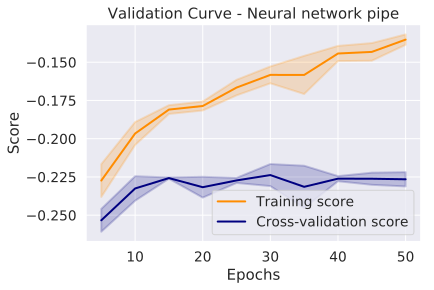

In [62]:
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve - Neural network pipe")
plt.xlabel("Epochs")
plt.ylabel("Score")
# plt.ylim(0.0, 1.1)
lw = 2
plt.plot(param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw)
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
plt.plot(param_range, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.legend(loc="best")
plt.show()


In [63]:
nn_pipe.set_params(nn__epochs=40)
nn_pipe.fit(X_train_raw, y_train)

Train on 15740 samples
Epoch 1/40
15740/15740 [==============================] - 1s 67us/sample - loss: 0.3184
Epoch 2/40
15740/15740 [==============================] - 1s 59us/sample - loss: 0.2661
Epoch 3/40
15740/15740 [==============================] - 1s 68us/sample - loss: 0.2488
Epoch 4/40
15740/15740 [==============================] - 1s 58us/sample - loss: 0.2360
Epoch 5/40
15740/15740 [==============================] - 1s 42us/sample - loss: 0.2259
Epoch 6/40
15740/15740 [==============================] - 0s 24us/sample - loss: 0.2213
Epoch 7/40
15740/15740 [==============================] - 0s 24us/sample - loss: 0.2157
Epoch 8/40
15740/15740 [==============================] - 0s 25us/sample - loss: 0.2115
Epoch 9/40
15740/15740 [==============================] - 0s 25us/sample - loss: 0.2059
Epoch 10/40
15740/15740 [==============================] - 0s 24us/sample - loss: 0.2013
Epoch 11/40
15740/15740 [==============================] - 0s 24us/sample - loss: 0.1990
Epoch 1

Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...)), ('nn', <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb8e2353dd8>)])

In [64]:
predict_and_score(nn_pipe)

Test RMSE: 43412
Test MAPE:  17.41%
Explained variance: 79.66%


## Train a XGBoost regressor

In [65]:
from xgboost import XGBRegressor

xgb_params = {
    'learning_rate':0.01,
    'n_estimators':6000,
    'max_depth':4,
    'min_child_weight':0,
    'gamma':0.6,
    'subsample':0.7,
    'colsample_bytree':0.7,
    'objective':'reg:squarederror',
    'nthread':-1,
    'scale_pos_weight':1,
    'seed':27,
    'reg_alpha':0.00006,
    'random_state':42
}

xgb_pipe = Pipeline(steps=[
    ('preprocess', preprocessing_pipe),
    ('reg', XGBRegressor(**xgb_params))
])

In [66]:
xgb_pipe.fit(X_train_raw, y_train)

Pipeline(memory=None,
     steps=[('preprocess', ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
         transformer_weights=None,
         transformers=[('numeric', Pipeline(memory=None,
     steps=[('extend_features', ExtendFeatures()), ('quantile_mapper', DataFrameMapper(default=None, df_out=True,
 ...=6e-05, reg_lambda=1, scale_pos_weight=1, seed=27,
       silent=None, subsample=0.7, verbosity=1))])

In [67]:
predict_and_score(xgb_pipe)

Test RMSE: 41311
Test MAPE:  15.90%
Explained variance: 81.70%


# Ensemble regressor: stacking the best (less correlated) models

## Model correlations

In [68]:
# Models to use in the stack:
regressors = {'lm': lm_pipe, 
              'ridge': ridge_pipe, 
              'lasso': lasso_pipe, 
              'elastic_net': elastic_net_pipe, 
              'rf': rf_pipe,
              'rf_poly_pca': rf_poly_pca_pipe, 
              'nn': nn_pipe, 
              'xgb': xgb_pipe}

In [69]:
def predictions_from_models(X, regressors):
    predictions = np.ndarray((len(X), len(regressors)))
    for idx, regressor in enumerate(regressors.values()):
        predictions[:, idx] = regressor.predict(X).flat
    return pd.DataFrame(predictions, columns=regressors.keys())

predictions = predictions_from_models(X_test_raw, regressors)

[MLENS] backend: threading


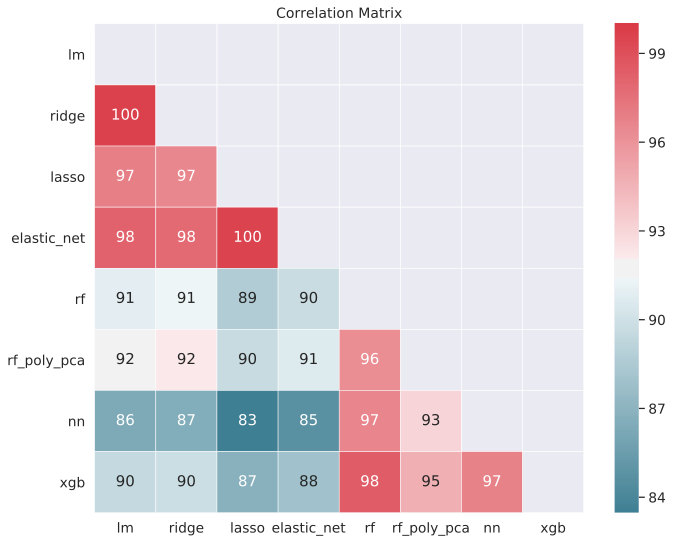

In [70]:
from mlens.visualization import corrmat

corrmat(predictions.corr())

## Ensemble definition

In [72]:
from mlens.ensemble import SuperLearner
from mlens.metrics import rmse

ensemble = SuperLearner(scorer=rmse, random_state=42, verbose=2)

# 1st layer
ensemble.add([regressors[name] for name in ['lm', 'elastic_net', 'rf', 'rf_poly_pca', 'xgb']])

# Attach the final meta estimator
ensemble.add_meta(XGBRegressor(**xgb_params))

SuperLearner(array_check=None, backend=None, folds=2,
       layers=[Layer(backend='threading', dtype=<class 'numpy.float32'>, n_jobs=-1,
   name='layer-1', propagate_features=None, raise_on_exception=True,
   random_state=7270, shuffle=False,
   stack=[Group(backend='threading', dtype=<class 'numpy.float32'>,
   indexer=FoldIndex(X=None, folds=2, raise_on_ex...810da60>)],
   n_jobs=-1, name='group-3', raise_on_exception=True, transformers=[])],
   verbose=1)],
       model_selection=False, n_jobs=None, raise_on_exception=True,
       random_state=42, sample_size=20,
       scorer=<function rmse at 0x7fb8a810da60>, shuffle=False, verbose=2)

In [73]:
# Fit ensemble
ensemble.fit(X_train_raw, y_train.ravel())

# Predict
predictions = ensemble.predict(X_test_raw)


Fitting 2 layers
Processing layer-1             

/home/diego/miniconda3/lib/python3.6/site-packages/sklearn/ensemble/base.py:154: UserWarning: Loky-backed parallel loops cannot be nested below threads, setting n_jobs=1
  n_jobs = min(effective_n_jobs(n_jobs), n_estimators)
/home/diego/miniconda3/lib/python3.6/site-packages/sklearn/ensemble/base.py:154: UserWarning: Loky-backed parallel loops cannot be nested below threads, setting n_jobs=1
  n_jobs = min(effective_n_jobs(n_jobs), n_estimators)


done | 00:01:12
Processing layer-2             done | 00:00:44
Fit complete                        | 00:01:57

Predicting 2 layers
Processing layer-1             

/home/diego/miniconda3/lib/python3.6/site-packages/sklearn/ensemble/base.py:154: UserWarning: Loky-backed parallel loops cannot be nested below threads, setting n_jobs=1
  n_jobs = min(effective_n_jobs(n_jobs), n_estimators)


done | 00:00:01
Processing layer-2             done | 00:00:00
Predict complete                    | 00:00:01


In [74]:
print("Fit data:\n%r" % ensemble.data)

Fit data:
                       score-m  score-s   ft-m  ft-s  pt-m  pt-s
layer-1  pipeline-1       0.58     0.00   0.92  0.11  0.74  0.01
layer-1  pipeline-2       0.62     0.00   3.86  0.43  2.23  0.28
layer-1  pipeline-3       0.44     0.00  36.82  0.08  1.00  0.01
layer-1  pipeline-4       0.51     0.00  18.83  1.83  4.98  1.61
layer-1  pipeline-5       0.42     0.00  55.26  0.07  0.58  0.02



In [75]:
predict_and_score(ensemble)


Predicting 2 layers
Processing layer-1             

/home/diego/miniconda3/lib/python3.6/site-packages/sklearn/ensemble/base.py:154: UserWarning: Loky-backed parallel loops cannot be nested below threads, setting n_jobs=1
  n_jobs = min(effective_n_jobs(n_jobs), n_estimators)


done | 00:00:01
Processing layer-2             done | 00:00:00
Predict complete                    | 00:00:01
Test RMSE: 41162
Test MAPE:  15.82%
Explained variance: 81.79%
